In [1]:
# Repeating pattern extraction technique
# This is my research project where I aim to replicate the Repeating Pattern Extraction Technique (REPET) as mentioned in the paper titled 
# "Repeating pattern extraction technique (REPET): A simple method for music/voice separation" by Rafii, Zafar, and Bryan Pardo, 
# published in IEEE Transactions on Audio, Speech, and Language Processing 21.1 (2012), pages 73-84, using Python.

C:\Users\watug\AppData\Local\Temp\ipykernel_34204\2343229669.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file)
D:\anaconda3\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


Sampling rate: 22050
Window size: 1024


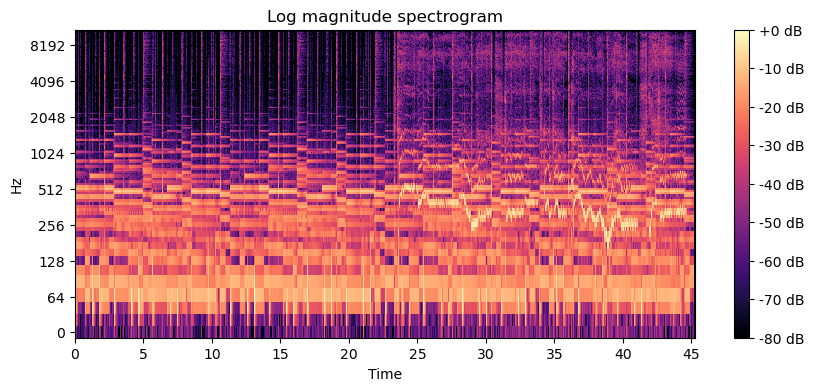

NameError: name 'Audio' is not defined

In [1]:
import librosa
import audioread
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import soundfile as sf

# Load the audio file
audio_file = 'Test Case 01 Vocal + Track 20240715.mp3'
y, sr = librosa.load(audio_file)

print ("Sampling rate:", sr)

# Define parameters
# Calculate the window size (n_fft) based on the sample rate (sr) and a window duration of 0.04 seconds
# 1. 0.04*sr: Calculate the window length in samples for 0.04 seconds
# 2. np.log2(0.04*sr): Compute the base-2 logarithm of the window length
# 3. np.ceil(np.log2(0.04*sr)): Round up to the nearest integer to ensure the window length is at least as large as needed
# 4. int(np.ceil(np.log2(0.04*sr))): Convert the result to an integer for use as an exponent
# 5. pow(2, int(np.ceil(np.log2(0.04*sr)))): Calculate 2 raised to the power of the integer, ensuring n_fft is a power of 2
n_fft = pow(2, int(np.ceil(np.log2(0.04*sr)))) # Window length
print ("Window size:", n_fft)
hop_length = n_fft // 2  # half-overlapping
window = 'hamming'  # Hamming window

# Perform STFT
X = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, window=window)

# Convert to magnitude spectrogram
V = np.abs(X)

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(V, ref=np.max), sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Log magnitude spectrogram')
plt.show()

Audio(y, rate=sr)

513
1949


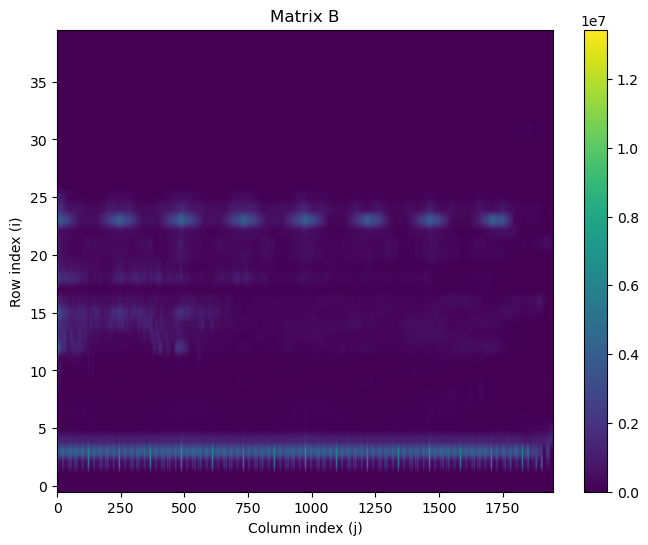

In [2]:
# Compute matrix B
m = V.shape[1] # Number of columns in V
print (V.shape[0])
print (V.shape[1])
# m = 454 # Number of columns in V
# B = np.zeros((V.shape[0], m))
B = np.zeros((40, m))

# for i in range(V.shape[0]):
for i in range(40):
    for j in range(m):
        sum_val = 0
        for k in range(m - j):
            sum_val += (V[i, k] ** 2) * (V[i, k + j - 1] ** 2)
        B[i, j] = sum_val / (m - j + 1)

plt.figure(figsize=(8, 6))
# plt.imshow(B, aspect='auto', origin='lower', extent=[0, m, 0, V.shape[0]])
plt.imshow(B, aspect='auto', origin='lower')
plt.colorbar()
plt.title('Matrix B')
plt.xlabel('Column index (j)')
plt.ylabel('Row index (i)')
plt.show()

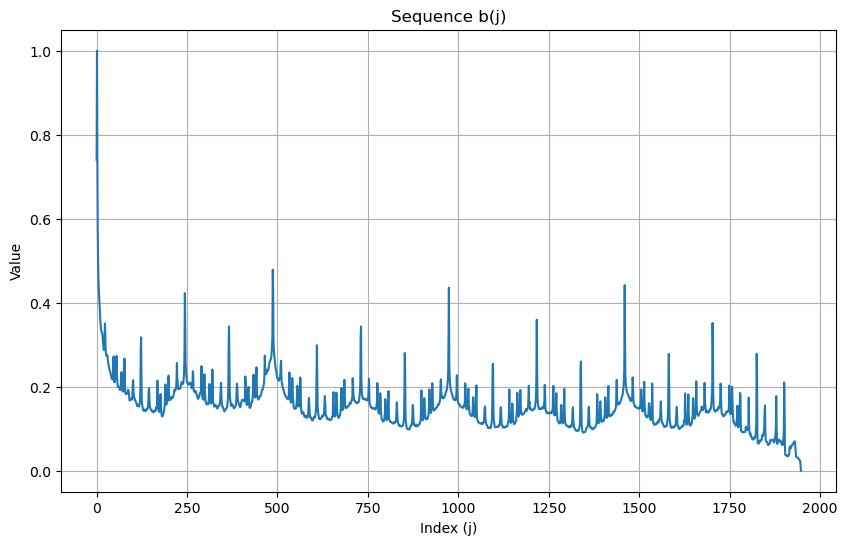

In [3]:
# Create a sequence b(j)
n = B.shape[0]  # Number of rows in B
b = np.zeros((B.shape[1],))  # Initialize sequence b(j)

for j in range(B.shape[1]):  # Iterate over columns of B
    column_sum = np.sum(B[:, j])  # Calculate sum of values in column j
    b[j] = column_sum / n  # Compute b(j) by dividing the sum by n

b_normalized = b / b[1]

# Plot the sequence b(j)
plt.figure(figsize=(10, 6))
plt.plot(b_normalized)
plt.title('Sequence b(j)')
plt.xlabel('Index (j)')
plt.ylabel('Value')
plt.grid(True)
plt.show()

The length of list b is: 1949
The length of b_longest_1/4_removed is: 1462


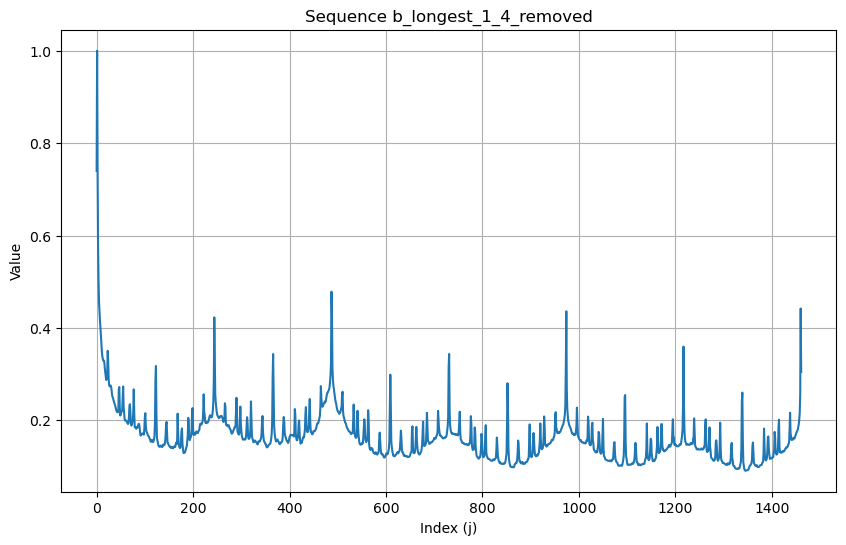

In [4]:
print("The length of list b is:", len(b))

# num_to_remove = len(b_normalized) // 4  # Calculate the number of elements to remove
# sorted_indices = np.argsort(b_normalized)  # Get the indices that would sort the array
# indices_to_keep = sorted_indices[:-num_to_remove]  # Keep all but the top 1/4 indices
# b_longest_1_4_removed = b_normalized[indices_to_keep]  # Remove the top 1/4 of the maximum values

# Calculate the number of elements to remove
remove_count = len(b_normalized) // 4

# Remove the last 1/4 of the elements
b_longest_1_4_removed = b_normalized[:-remove_count]

print("The length of b_longest_1/4_removed is:", len(b_longest_1_4_removed))

plt.figure(figsize=(10, 6))
plt.plot(b_longest_1_4_removed)
plt.title('Sequence b_longest_1_4_removed')
plt.xlabel('Index (j)')
plt.ylabel('Value')
plt.grid(True)
plt.show()

l = len(b_longest_1_4_removed)

In [5]:
import math

# Algorithm 1: Find repeating period p from beat spectrum b
# Calculate the range of the first 1/3
one_third_length = len(b_longest_1_4_removed) // 3
δ = 2
# J = np.zeros((one_third_length,))
J = np.zeros(one_third_length)
for j in range(4, one_third_length):
    delta = math.floor(3 * j / 4)
    I = 0
    # print("For period j =", j, ", delta =", delta)
    i_max = len(b_longest_1_4_removed) // j
    for i in range(1, i_max + 1):
        start_index = max(i - δ, 0)
        end_index = i + δ
        # h = start_index + np.argmax(b_longest_1_4_removed[start_index:end_index+1])
        h = np.argmax(b_longest_1_4_removed[start_index:end_index+1])
        if delta == 0:
            add_num = 0
        else:
            add_num = np.argmax(b_longest_1_4_removed[max(i-delta, 0):(i+delta)+1])
        # if h == (i-delta) + add_num:
        if h == add_num:
            subset = b_longest_1_4_removed[max(i-delta, 0):(i+delta)+1]
            average = sum(subset) / len(subset)
            I = I + b_longest_1_4_removed[h] - average
    J[j] = I / math.floor(l/j)
p = np.argmax(J) + 1
# print(J)
print("Repeating period is:", p)

Repeating period is: 484


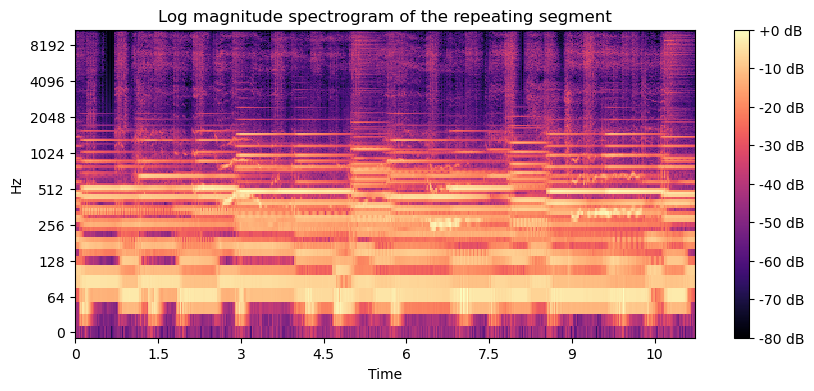

In [6]:
S = np.zeros((V.shape[0], p))

r = V.shape[1] // (p+1)

for i in range(V.shape[0]):
    for j in range(p):
        # Collect the values for median calculation
        values = [V[i, j + (k - 1) * p] for k in range(1, r + 1) if j + (k - 1) * p < V.shape[1]]
        # values = [V[i, l + (k - 1) * p] for k in range(1, r + 1)]
        S[i, j] = np.median(values)

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max), sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Log magnitude spectrogram of the repeating segment')
plt.show()

from IPython.display import Audio
# Convert S back to time domain
S_complex = S * np.exp(1j * np.angle(X[:, :p]))  # Reconstruct complex-valued STFT
y_reconstructed = librosa.istft(S_complex, hop_length=hop_length, window=window)

# Save the audio
output_file = 'Repeating section.wav'
sf.write(output_file, y_reconstructed, sr)

# Create a playback window
Audio(y_reconstructed, rate=sr)

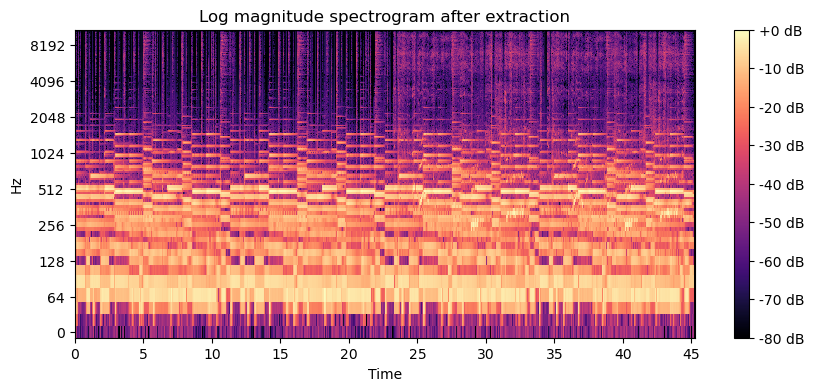

In [7]:
W = np.zeros((V.shape[0], V.shape[1]))

for i in range(V.shape[0]):
    for j in range(V.shape[1]):
        values = [S[i, j % p], V[i, j]]
        W[i, j] = np.min(values)
        # W[i,j] = S[i, j % p]

# Plot the magnitude spectrogram
plt.figure(figsize=(10, 4))
librosa.display.specshow(librosa.amplitude_to_db(W, ref=np.max), sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Log magnitude spectrogram after extraction')
plt.show()

In [8]:
# Convert W back to time domain
W_complex = W * np.exp(1j * np.angle(X))  # Reconstruct complex-valued STFT
y_reconstructed_W = librosa.istft(W_complex, hop_length=hop_length, window=window)

# Save the reconstructed audio
output_file_W = 'after extraction.wav'
sf.write(output_file_W, y_reconstructed_W, sr)

# Create a playback window
Audio(y_reconstructed_W, rate=sr)

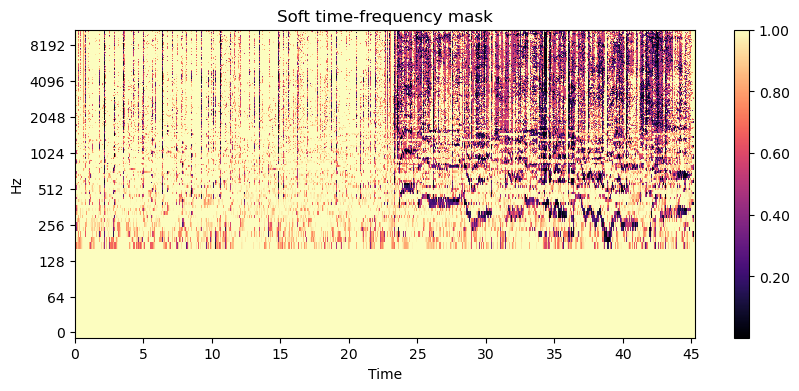

In [9]:
# The calculation of the soft time-frequency mask
M = np.zeros((V.shape[0], V.shape[1]))

for i in range(V.shape[0]):
    for j in range(V.shape[1]):
        # if V[i, j] != 0:
        #     M[i, j] = (W[i, j] + np.finfo(float).eps) / (V[i, j] + np.finfo(float).eps)
        # else:
        #     M[i, j] = 0
        M[i, j] = (W[i, j] + np.finfo(float).eps) / (V[i, j] + np.finfo(float).eps)

# Initialize a high-pass filter
cutoff_frequency = 150
cutoff_point = round(cutoff_frequency * n_fft / sr)
M[0 : cutoff_point + 1, :] = 1

# # Plot the magnitude spectrogram
# plt.figure(figsize=(10, 4))
# librosa.display.specshow(librosa.amplitude_to_db(M, ref=np.max), sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
# plt.colorbar(format='%+2.0f dB')
# plt.title('Log magnitude spectrogram of the soft time-frequency mask')
# plt.show()

# Plot the magnitude spectrogram from 0 to 1
plt.figure(figsize=(10, 4))
librosa.display.specshow(M, sr=sr, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%0.2f')
plt.title('Soft time-frequency mask')
plt.show()

In [10]:
# Apply the soft time-frequency mask to the STFT matrix X
X_masked = X * M

# Convert the masked STFT matrix back to time domain
y_reconstructed = librosa.istft(X_masked, hop_length=hop_length, window=window)

# Save the reconstructed audio
# output_file_masked = 'reconstructed_audio_masked.wav'
output_file_masked = 'output01_Track.wav'
sf.write(output_file_masked, y_reconstructed, sr)

# Create a playback window
Audio(y_reconstructed, rate=sr)

In [11]:
X_finished = X - X_masked

# Convert the masked STFT matrix back to time domain
y_reconstructed = librosa.istft(X_finished, hop_length=hop_length, window=window)

# Save the reconstructed audio
output_file_masked = 'output02_Vocal.wav'
sf.write(output_file_masked, y_reconstructed, sr)

# Create a playback window
Audio(y_reconstructed, rate=sr)